In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import plotly
import plotly.graph_objs as go
import plotly.figure_factory as ff
import plotly.express as px

from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction import DictVectorizer as DV

## Step 5: Data cleaning

Some points to keep in mind: 

- [ ] Find missing values. 
- [ ] Find NaN and 0 values. 
- [ ] Do all columns have the same dtypes?
- [ ] Convert dates to datetime types.
    - [ ] You can use the python package arrow or datetime.
- [ ] Convert categorical variables to type 'category' if working with pandas. 
- [ ] Convert strings to ints or floats if they represent numbers.
- [ ] Standardize strings
    - [ ] Convert them to lower case if possible.
    - [ ] Replace spaces with underscores or dashes.
    - [ ] Remove white spaces around the string **this is very critical**.
    - [ ] Check of inconsistent spellings *typically done manually*.
- [ ] Look for duplicate rows or columns.
- [ ] Look for preprocessed columns; example: A categorical column that has been duplicated 
    with categorical labels.
    
A list of data cleaning libraries: https://mode.com/blog/python-data-cleaning-libraries/ 

In [2]:
df=pd.read_csv("../../data/external/dataset.csv")
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


### Dropping Columns
- CLIENTNUM is a unique identifier for each row and will not be used
- Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1 & Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2 are classifier columns derived either from the bank's internal team or from the original poster of the dataset

In [3]:
df = df.drop(["CLIENTNUM", 
              "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1", 
              "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2"
             ], axis=1)

### Null Values

In [38]:
df.isnull().sum(axis=0)

Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

- There are no null values in entire dataframe

In [5]:
df.isnull().sum(axis=0)

Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [6]:
df.shape

(10127, 20)

Rows: 10,127
Columns: 20
    - Character: 6
    - Numeric: 14
 

<AxesSubplot:title={'center':'Distribution Existing Vs Attrited Customers'}, xlabel='Attrition_Flag', ylabel='count'>

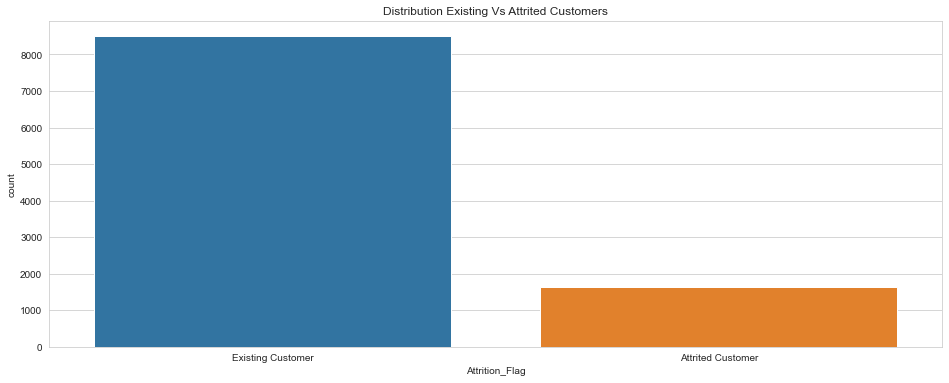

In [7]:
sns.set_style("whitegrid")
plt.figure(figsize=(16, 6))
plt.title("Distribution Existing Vs Attrited Customers")
sns.countplot(x=df['Attrition_Flag'])

- dataset is imbalanced
- how do we show percentages here?

<AxesSubplot:xlabel='Education_Level', ylabel='Total_Trans_Amt'>

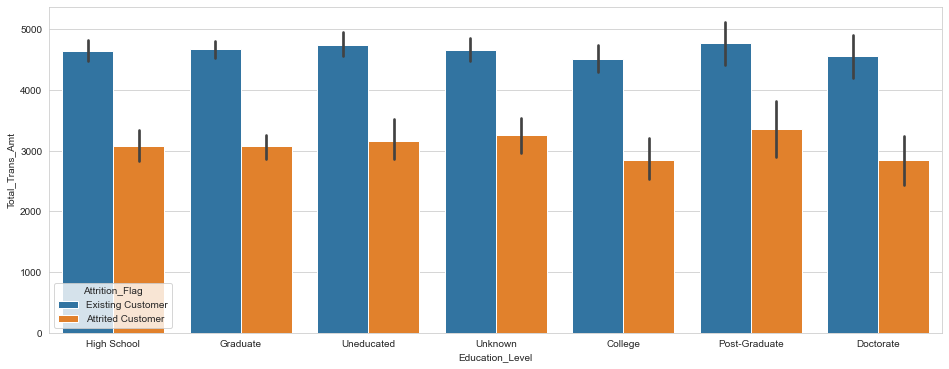

In [8]:
plt.figure(figsize=(16, 6))
sns.barplot(x="Education_Level", y="Total_Trans_Amt", hue='Attrition_Flag', data=df)

Education Level did not affect Transaction amount and Attrition.

In [9]:
fig=go.Figure()
fig.add_trace(go.Histogram(x=df.loc[df['Attrition_Flag']=='Existing Customer']['Education_Level'],
                           histnorm='probability density',marker=dict(color='crimson'),
                           opacity=0.75,name='Education level of existing customers'))
fig.add_trace(go.Histogram(x=df.loc[df['Attrition_Flag']=='Attrited Customer']['Education_Level'],
                           histnorm='probability density',marker=dict(color='dodgerblue'),
                           opacity=0.75,name='Education level of churned customers'))
fig.update_layout(title='Education level',legend=dict(x=0.5,xanchor='center',orientation='h'),margin=dict(l=0,r=0,t=30,b=0))
fig.show()

<AxesSubplot:xlabel='Card_Category', ylabel='Total_Trans_Amt'>

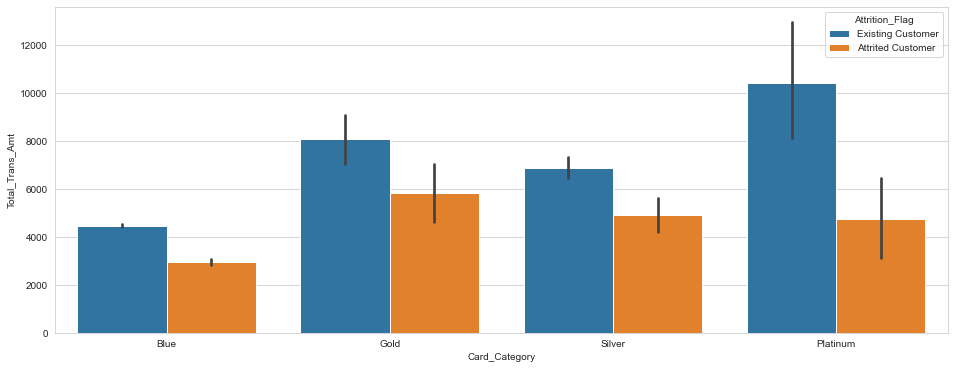

In [10]:
# sns.set(rc={'figure.figsize':(15,7)})
plt.figure(figsize=(16, 6))
sns.barplot(x="Card_Category", y="Total_Trans_Amt", hue='Attrition_Flag', data=df)

<AxesSubplot:xlabel='Marital_Status', ylabel='Total_Trans_Amt'>

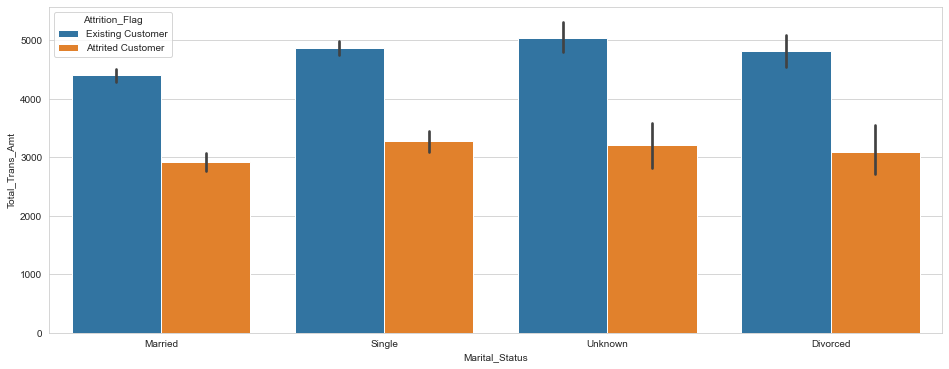

In [11]:
plt.figure(figsize=(16, 6))
sns.barplot(x="Marital_Status", y="Total_Trans_Amt", hue='Attrition_Flag', data=df)

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Months_Inactive_12_mon'>

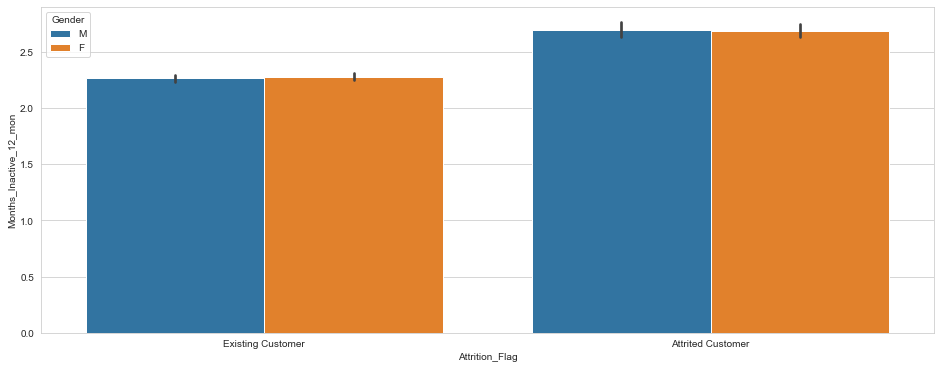

In [12]:
plt.figure(figsize=(16, 6))
sns.barplot(x="Attrition_Flag", y="Months_Inactive_12_mon", hue='Gender', data=df)

In [13]:
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


# Pairplots

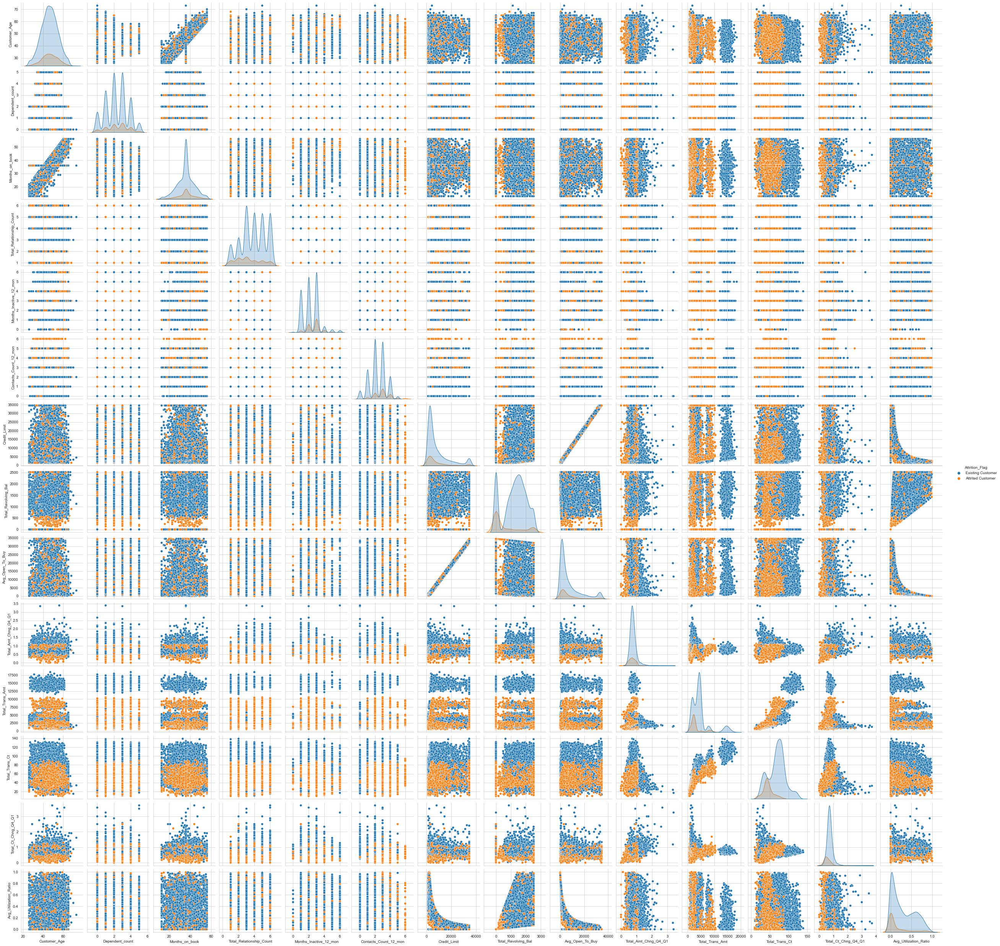

In [14]:
sns.pairplot(df, hue = 'Attrition_Flag')

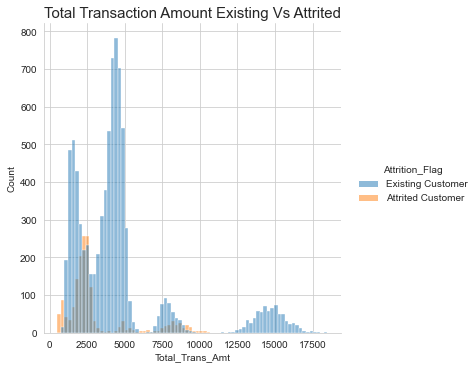

In [15]:
sns.displot(data=df, x='Total_Trans_Amt', hue='Attrition_Flag')
plt.title('Total Transaction Amount Existing Vs Attrited',fontsize=15);

Total transaction amt for attrited customers peaked at 2500 vs existing at 5000.

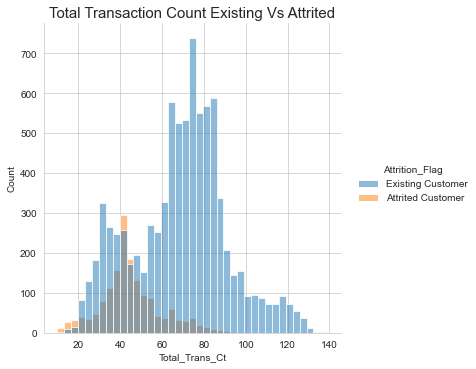

In [16]:
sns.displot(data=df, x='Total_Trans_Ct', hue='Attrition_Flag')
plt.title('Total Transaction Count Existing Vs Attrited',fontsize=15);

Total transaction count for attrited customers peaked at around 40 transactions, existing customers transaction ct is double that peaking at 80 transactions.

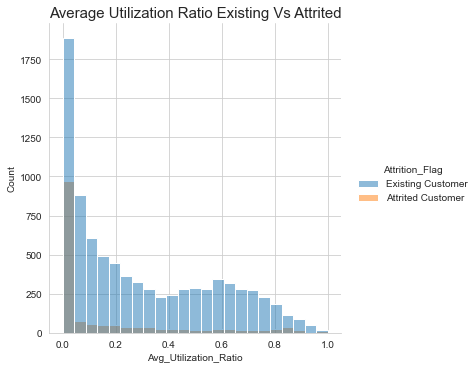

In [17]:
sns.displot(data=df, x='Avg_Utilization_Ratio', hue='Attrition_Flag')
plt.title('Average Utilization Ratio Existing Vs Attrited',fontsize=15);

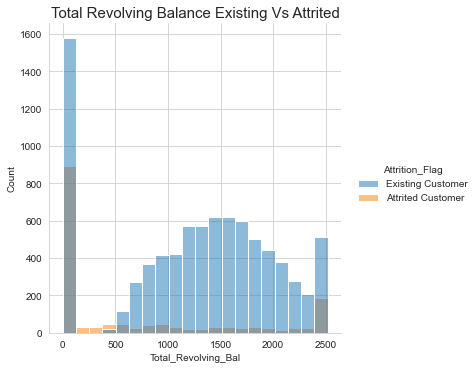

In [18]:
sns.displot(data=df, x='Total_Revolving_Bal', hue='Attrition_Flag')
plt.title('Total Revolving Balance Existing Vs Attrited',fontsize=15);

Majority of attrited customers do not utilize their credit cards, as seen above in both plots.

# Outliers

In [19]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000


Describe results above show that most columns have acceptable anomaly range, and there is no erroneous data captured such unnaturally high customer age. If you compare mean and median (50%) values, the larger the values the more likelihood of outliers in those features. For example, credit limit mean is \\$8631.95 while the median is $4549. This could indicate there are outliers due to wide discrepancy.
Avg_Open_To_Buy - could be the amount of credit available to use at a given time & Avg_Utilization_Ratio. This also has a wide discrepancy but that may be normal. We will plot to confirm.

### Interquartile Range (IQR) is a measure of statistical dispersion

IQR is the 1st quartile subtracted from the 3rd quartile.

In [7]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

Customer_Age                  11.000
Dependent_count                2.000
Months_on_book                 9.000
Total_Relationship_Count       2.000
Months_Inactive_12_mon         1.000
Contacts_Count_12_mon          1.000
Credit_Limit                8512.500
Total_Revolving_Bal         1425.000
Avg_Open_To_Buy             8534.500
Total_Amt_Chng_Q4_Q1           0.228
Total_Trans_Amt             2585.500
Total_Trans_Ct                36.000
Total_Ct_Chng_Q4_Q1            0.236
Avg_Utilization_Ratio          0.480
dtype: float64


In [9]:
print(df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))

       Attrition_Flag  Avg_Open_To_Buy  Avg_Utilization_Ratio  Card_Category  \
0               False            False                  False          False   
1               False            False                  False          False   
2               False            False                  False          False   
3               False            False                  False          False   
4               False            False                  False          False   
...               ...              ...                    ...            ...   
10122           False            False                  False          False   
10123           False            False                  False          False   
10124           False            False                  False          False   
10125           False            False                  False          False   
10126           False            False                  False          False   

       Contacts_Count_12_mon  Credit_Li

TypeError: Cannot perform 'ror_' with a dtyped [bool] array and scalar of type [NoneType]

The output above shows true / false values for all datapoints, where false means the value is valid but true indicates presence of an outlier.

<AxesSubplot:ylabel='Customer_Age'>

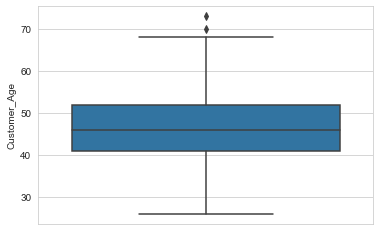

In [21]:
sns.boxplot(y='Customer_Age', hue='Attrition_Flag', data=df)

<AxesSubplot:ylabel='Dependent_count'>

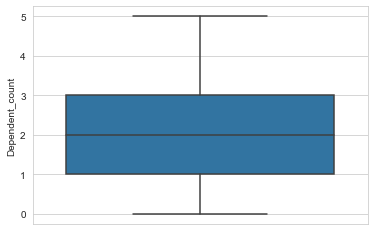

In [22]:
sns.boxplot(y='Dependent_count', hue='Attrition_Flag', data=df)

<AxesSubplot:ylabel='Months_on_book'>

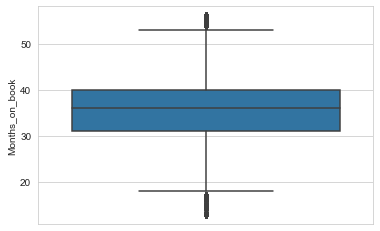

In [23]:
sns.boxplot(y='Months_on_book', hue='Attrition_Flag', data=df)

<AxesSubplot:ylabel='Total_Relationship_Count'>

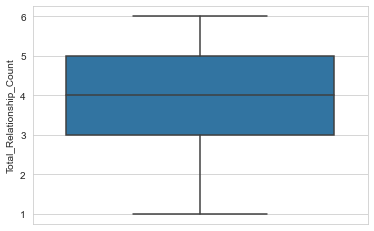

In [24]:
sns.boxplot(y='Total_Relationship_Count', hue='Attrition_Flag', data=df)

<AxesSubplot:ylabel='Months_Inactive_12_mon'>

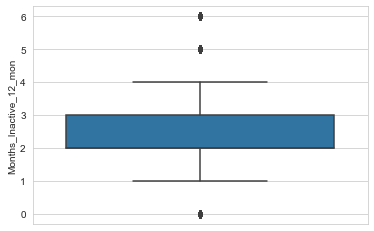

In [25]:
sns.boxplot(y='Months_Inactive_12_mon', hue='Attrition_Flag', data=df)

<AxesSubplot:ylabel='Contacts_Count_12_mon'>

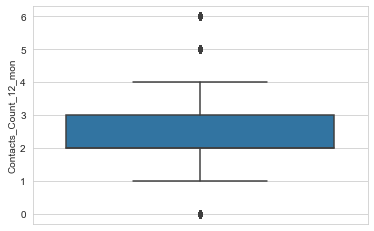

In [26]:
sns.boxplot(y='Contacts_Count_12_mon', hue='Attrition_Flag', data=df)

<AxesSubplot:ylabel='Credit_Limit'>

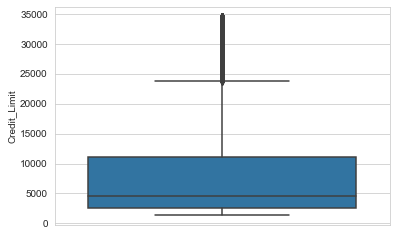

In [27]:
sns.boxplot(y='Credit_Limit', hue='Attrition_Flag', data=df)

<AxesSubplot:ylabel='Total_Revolving_Bal'>

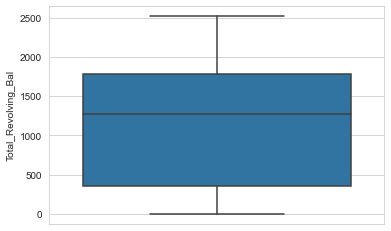

In [28]:
sns.boxplot(y='Total_Revolving_Bal', hue='Attrition_Flag', data=df)

<AxesSubplot:ylabel='Avg_Open_To_Buy'>

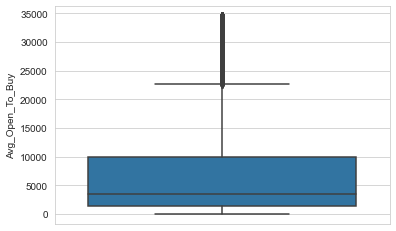

In [29]:
sns.boxplot(y='Avg_Open_To_Buy', hue='Attrition_Flag', data=df)

<AxesSubplot:ylabel='Total_Amt_Chng_Q4_Q1'>

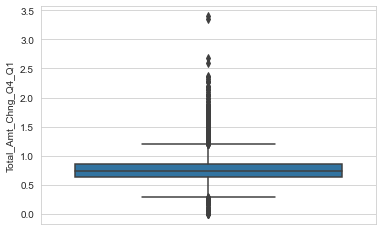

In [30]:
sns.boxplot(y='Total_Amt_Chng_Q4_Q1', hue='Attrition_Flag', data=df)

<AxesSubplot:ylabel='Total_Trans_Amt'>

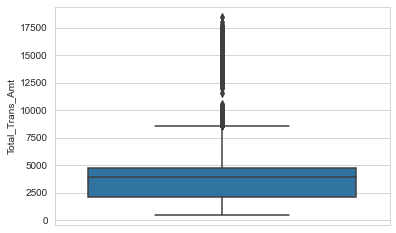

In [31]:
sns.boxplot(y='Total_Trans_Amt', hue='Attrition_Flag', data=df)

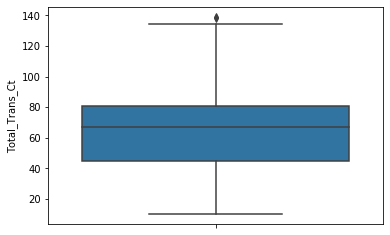

In [10]:
sns.boxplot(y='Total_Trans_Ct', hue='Attrition_Flag', data=df)

<AxesSubplot:ylabel='Total_Ct_Chng_Q4_Q1'>

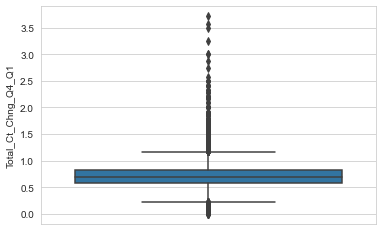

In [32]:
sns.boxplot(y='Total_Ct_Chng_Q4_Q1', hue='Attrition_Flag', data=df)

<AxesSubplot:ylabel='Avg_Utilization_Ratio'>

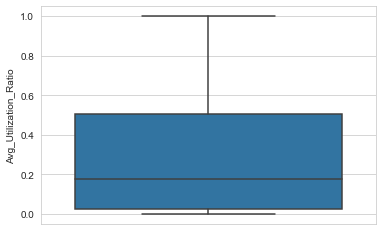

In [33]:
sns.boxplot(y='Avg_Utilization_Ratio', hue='Attrition_Flag', data=df)

### Correcting and Removing Outliers

In [18]:
df_without_outliers = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]
df_without_outliers

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10,Existing Customer,42,M,5,Uneducated,Unknown,$120K +,Blue,31,5,3,2,6748.0,1467,5281.0,0.831,1201,42,0.680,0.217
14,Existing Customer,57,F,2,Graduate,Married,Less than $40K,Blue,48,5,2,2,2436.0,680,1756.0,1.190,1570,29,0.611,0.279
19,Existing Customer,45,F,2,Graduate,Married,Unknown,Blue,37,6,1,2,14470.0,1157,13313.0,0.966,1207,21,0.909,0.080
21,Attrited Customer,62,F,0,Graduate,Married,Less than $40K,Blue,49,2,3,3,1438.3,0,1438.3,1.047,692,16,0.600,0.000
23,Existing Customer,47,F,4,Unknown,Single,Less than $40K,Blue,36,3,3,2,2492.0,1560,932.0,0.573,1126,23,0.353,0.626
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10048,Attrited Customer,48,M,4,College,Married,$80K - $120K,Blue,44,2,3,3,9524.0,1449,8075.0,0.559,7527,58,0.657,0.152
10052,Attrited Customer,31,M,1,Post-Graduate,Single,$40K - $60K,Blue,24,4,2,4,4169.0,534,3635.0,0.836,8565,70,0.795,0.128
10067,Attrited Customer,49,F,4,Uneducated,Married,$40K - $60K,Blue,36,5,2,3,4167.0,0,4167.0,0.581,7590,87,0.776,0.000
10089,Attrited Customer,52,F,5,Unknown,Married,Less than $40K,Blue,36,4,3,3,9611.0,0,9611.0,0.840,7636,64,0.829,0.000


In [17]:
print(df.shape)
print(df_without_outliers.shape)

(10127, 20)
(6802, 20)


In [34]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numeric_df = df.select_dtypes(include=numerics)
numeric_df.head()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [35]:
categoricals = ['object']
categorical_df = df.select_dtypes(include=categoricals)
categorical_df.head()

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
0,Existing Customer,M,High School,Married,$60K - $80K,Blue
1,Existing Customer,F,Graduate,Single,Less than $40K,Blue
2,Existing Customer,M,Graduate,Married,$80K - $120K,Blue
3,Existing Customer,F,High School,Unknown,Less than $40K,Blue
4,Existing Customer,M,Uneducated,Married,$60K - $80K,Blue


### Transformation of categorical features

In [36]:
encoder = DV(sparse = False)
# df_cat=df[cat_cols]
df_cat = encoder.fit_transform(categorical_df.T.to_dict().values())
categorical_df=pd.DataFrame(df_cat,columns=encoder.get_feature_names())
categorical_df.head()

,Attrition_Flag=Attrited Customer,Attrition_Flag=Existing Customer,Card_Category=Blue,Card_Category=Gold,Card_Category=Platinum,Card_Category=Silver,Education_Level=College,Education_Level=Doctorate,Education_Level=Graduate,Education_Level=High School,...,Income_Category=$120K +,Income_Category=$40K - $60K,Income_Category=$60K - $80K,Income_Category=$80K - $120K,Income_Category=Less than $40K,Income_Category=Unknown,Marital_Status=Divorced,Marital_Status=Married,Marital_Status=Single,Marital_Status=Unknown
0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [39]:
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
